# Lung Disease Detection with a focus on Image Processing

In [1]:
# Uncomment for running on Google Colab
# !pip install visualkeras

     |████████████████████████████████| 992 kB 12.1 MB/s 


## Imports

In [2]:
import os
import io
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import visualkeras

from skimage.transform import resize
from skimage import color
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras import callbacks
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.layers import InputLayer, Rescaling, Conv2D, MaxPooling2D, Flatten, Dropout, Dense, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.metrics import AUC
from tensorflow.keras.utils import image_dataset_from_directory, plot_model, to_categorical


## Setting up constants for directory management

In [3]:
# Change ENV to suitable value, otherwise there could be multiple issues
ENV = "local"  # "local" or "colab"
LOCAL_DIR = os.path.join("path", "to", "local", "dir")
GOOGLEDRIVE_DIR = os.path.join("/content", "drive", "My Drive")
WORKING_DIR = os.path.join(LOCAL_DIR, "trials") if ENV == "local" else os.path.join(
    GOOGLEDRIVE_DIR, "trials")
DATA_DIR = os.path.join(os.getcwd(), "data", "processed") if ENV == "local" else os.path.join(
    "/content", "data", "processed")


## Google Drive import 
Uncomment below cell to mount google drive if running on Google Colab

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


## Dataset Operations
Copying pre-processed dataset from Google Drive to Google Colab environment and cleaning up unnecessary files

In [5]:
!mkdir /content/data
!tar -xf "/content/drive/MyDrive/MSc CS Project/Final deliverable/processed.tar" -C "/content/data"


In [6]:
!rm -r /content/data/processed/.ipynb_checkpoints
!rm -r /content/data/processed/desktop.ini
!rm -r /content/data/processed/normal/desktop.ini
!rm -r /content/data/processed/covid/desktop.ini


rm: cannot remove '/content/data/processed/.ipynb_checkpoints': No such file or directory
rm: cannot remove '/content/data/processed/desktop.ini': No such file or directory
rm: cannot remove '/content/data/processed/normal/desktop.ini': No such file or directory
rm: cannot remove '/content/data/processed/covid/desktop.ini': No such file or directory


## Input parameters

In [7]:
batch_size = 50
img_height = 256
img_width = 256


## CNN model

### Model creation

In [8]:
model = Sequential()
model.add(InputLayer(input_shape=(img_height, img_width, 1)))
model.add(Rescaling(1. / 255))
model.add(Conv2D(32, (3, 3), activation="relu", name="Conv3x3_32_1"))
model.add(Conv2D(32, (3, 3), activation="relu", name="Conv3x3_32_2"))
model.add(MaxPooling2D((2, 2), 2, name="MaxPool_32"))
model.add(BatchNormalization(name="BatNorm_32"))
model.add(Conv2D(64, (3, 3), activation="relu", name="Conv3x3_64_1"))
model.add(Conv2D(64, (3, 3), activation="relu", name="Conv3x3_64_2"))
model.add(MaxPooling2D((2, 2), 2, name="MaxPool_64"))
model.add(BatchNormalization(name="BatNorm_64"))
model.add(Conv2D(128, (3, 3), activation="relu", name="Conv3x3_128_1"))
model.add(Conv2D(128, (3, 3), activation="relu", name="Conv3x3_128_2"))
model.add(MaxPooling2D((2, 2), 2, name="MaxPool_128"))
model.add(BatchNormalization(name="BatNorm_128"))
model.add(Conv2D(256, (3, 3), activation="relu", name="Conv3x3_256_1"))
model.add(Conv2D(256, (3, 3), activation="relu", name="Conv3x3_256_2"))
model.add(MaxPooling2D((2, 2), 2, name="MaxPool_256"))
model.add(BatchNormalization(name="BatNorm_256"))
model.add(Flatten())
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.2))
model.add(BatchNormalization(name="BatNorm_FC"))
model.add(Dense(2, name="Classifier"))

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 1)       0         
                                                                 
 Conv3x3_32_1 (Conv2D)       (None, 254, 254, 32)      320       
                                                                 
 Conv3x3_32_2 (Conv2D)       (None, 252, 252, 32)      9248      
                                                                 
 MaxPool_32 (MaxPooling2D)   (None, 126, 126, 32)      0         
                                                                 
 BatNorm_32 (BatchNormalizat  (None, 126, 126, 32)     128       
 ion)                                                            
                                                                 
 Conv3x3_64_1 (Conv2D)       (None, 124, 124, 64)      18496     
                                                        

In [9]:
model.compile(
    optimizer="adam",
    loss=SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])


In [10]:
# Saving untrained model to be loaded on every fold of cross validation
model.save("untrained_model.h5")

### Model visualization

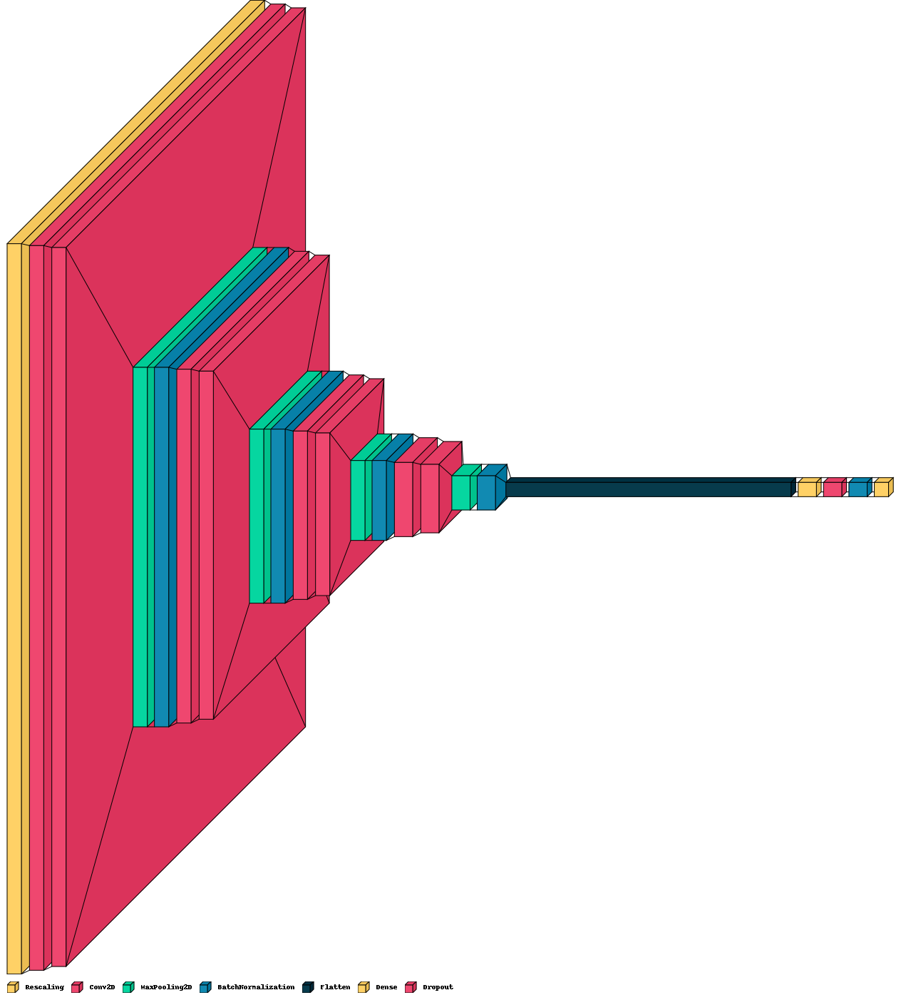

In [11]:
# Graphic representation of the model
visualkeras.layered_view(model, legend=True)


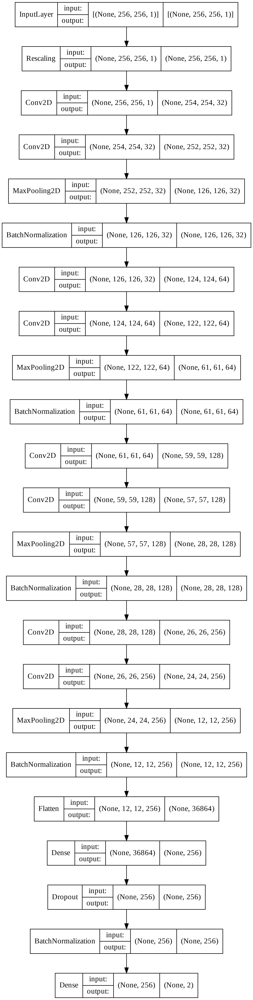

In [12]:
# Plotting the model and saving it to a file
plot_model(model, to_file="model.png", show_shapes=True,
           show_layer_names=False, dpi=300)


In [13]:
# Deleting model to free up memory
del model

In [14]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.magma):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.

        Parameters
        ----------
        cm : array, shape = [n_classes, n_classes]
            Confusion matrix.
        classes : array, shape = [n_classes]
            List of class names.
        normalize : bool
            Whether to normalize the confusion matrix or not.
        title : str
            Title of the plot.
        cmap : matplotlib colormap
            Colormap to use.
    """
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    sns.set(font_scale=1.4)
    figure, ax1 = plt.subplots(figsize=(10, 10))
    ax2 = sns.heatmap(cm, annot=True, fmt='g', cmap=cmap, xticklabels=classes, yticklabels=classes, ax=ax1)
    plt.tight_layout()
    plt.title(title)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')

    return figure

In [15]:
def plot_to_image(figure):
    """
    Converts the matplotlib plot specified by 'figure' to a PNG image and
    returns it. The supplied figure is closed and inaccessible after this call.

        Parameters
        ----------
        figure : matplotlib plot
            The plot to convert.
    """
    buf = io.BytesIO()
    plt.savefig(buf, format='png')

    plt.close(figure)
    buf.seek(0)

    image = tf.image.decode_png(buf.getvalue(), channels=4)
    
    image = tf.expand_dims(image, 0)
    return image

In [16]:
def compute_gradient_heatmap(model, layer_name, image):
    """
    Computes the gradient of the layer specified by 'layer_name' with respect to
    the input image and returns the heatmap of the resulting gradient.
    
        Parameters
        ----------
        model : keras model
            The model to compute the gradient of.
        layer_name : str
            The name of the layer to compute the gradient of.
        image : tensor
            The input image in the form of a tensor.
    """
    
    # Getting the model layer
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output])

    # Getting the output of the last convolution layer
    with tf.GradientTape() as tape:
        inputs = tf.cast(image, tf.float32)
        (conv_outputs, predictions) = grad_model(inputs)

        loss = predictions[:, tf.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_outputs)

    cast_conv_outputs = tf.cast(conv_outputs > 0, "float32")
    cast_grads = tf.cast(grads > 0, "float32")
    guided_grads = cast_conv_outputs * cast_grads * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    # Converting gradient represntation of the image to heatmap
    weights = tf.reduce_mean(guided_grads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, conv_outputs), axis=-1)

    (w, h) = (image.shape[2], image.shape[1])
    heatmap = resize(cam.numpy(), (w, h))

    # Normalizing heatmap and converting to uint8 for easier rendering
    numer = heatmap - np.min(heatmap)
    denom = (heatmap.max() - heatmap.min())
    heatmap = numer / denom
    heatmap = (heatmap * 255).astype("uint8")

    return heatmap


In [17]:
def overlay_gradient_heatmap(heatmap, image, alpha=0.9995, colormap=plt.cm.get_cmap("rainbow_r")):
    """
    Overlays the heatmap onto the image and returns the resulting image.

        Parameters
        ----------
        heatmap : numpy array
            The heatmap to overlay onto the image. Expected to be a grayscale image.
        image : numpy array
            The image to overlay onto. Expected to be a grayscale image. If the image is
            in tensor format, it needs to be converted to numpy format.
        alpha : float
            The transparency of the heatmap.
        colormap : matplotlib colormap
            The colormap to use.
    """
    
    # Converting image to RGB representation and then converting to HSV
    image_rgb = np.dstack((image, image, image))
    image_hsv = color.rgb2hsv(image_rgb)

    # Converting heatmap to HSV representation
    heatmap = np.uint8(255 * colormap(heatmap))
    heatmap = color.rgba2rgb(heatmap)
    heatmap_hsv = color.rgb2hsv(heatmap)

    # Overlaying heatmap onto image
    image_hsv[..., 0] = heatmap_hsv[..., 0]
    image_hsv[..., 1] = heatmap_hsv[..., 1] * alpha

    # Converting image back to RGB representation and normalizing
    output = color.hsv2rgb(image_hsv)
    output_norm = (output - output.min()) / (output.max() - output.min())

    return (heatmap, output_norm)


In [18]:
"""
- Loop through different cross validation folds and train the model on each fold.
- Compute the accuracy and loss of the model on the validation set for each fold 
and log them as CSV.
- Generates a heatmap of the gradient of the last convolutional layer of the model
and overlays it onto the image.
- Compute the confusion matrix for the validation set for each fold.
- Logs metrics (precision, recall, f1-score, accuracy) for each fold
"""

NUM_FOLDS = 5 # Number of folds to use for cross validation
AUTOTUNE = tf.data.AUTOTUNE # Used for auto tuning the number of threads used for data loading
EPOCHS = 50 # Number of epochs to train for
random_seed = np.random.randint(100000, high=99999999, size=5) # Random seed for different folds

for fold, seed in enumerate(random_seed):
    print("-"*80)
    print(f"Current seed: {seed}")
    print("-"*80)
    
    # Load the data
    train_ds = image_dataset_from_directory(
        DATA_DIR,
        validation_split=0.2,
        subset="training",
        color_mode="grayscale",
        seed=seed,
        image_size=(img_height, img_width),
        batch_size=batch_size
    )

    val_ds = image_dataset_from_directory(
        DATA_DIR,
        validation_split=0.2,
        subset="validation",
        color_mode="grayscale",
        seed=seed,
        image_size=(img_height, img_width),
        batch_size=batch_size
    )

    class_names = train_ds.class_names

    train_ds = train_ds.cache().prefetch(AUTOTUNE)
    val_ds = val_ds.cache().prefetch(AUTOTUNE)

    # Loads the 
    model = tf.keras.models.load_model("untrained_model.h5", compile=False)
    model.compile(
        optimizer="adam",
        loss=SparseCategoricalCrossentropy(from_logits=True),
        metrics=['accuracy'])
    model.trainable = True

    # Log path for checkpoints, tensorboard, and CSV files
    checkpoint_path = os.path.join(
        WORKING_DIR, "checkpoints", f"fold_{str(fold)}.h5")
    tensorboard_log_path = os.path.join(WORKING_DIR, "final", "logs",
                                        "scalars", f"fold_{str(fold)}")
    tensorboard_report_log_path = os.path.join(WORKING_DIR, "logs",
                                               "classification_report", f"fold_{str(fold)}")
    csv_log_path = os.path.join(
        WORKING_DIR, "csv_metrics", f"fold_{str(fold)}_metrics.csv",)
    tensorboard_image_log_path = os.path.join(
        WORKING_DIR, "logs", "image", f"fold_{str(fold)}")
    file_writer_hmap = tf.summary.create_file_writer(
        os.path.join(tensorboard_image_log_path, "heatmap"))
    file_writer_cm = tf.summary.create_file_writer(
        os.path.join(tensorboard_image_log_path, "confusion_matrix"))
    file_writer_cr = tf.summary.create_file_writer(tensorboard_report_log_path)

    # Callbacks
    cbs = [
        callbacks.ReduceLROnPlateau(
            monitor='val_loss', factor=0.2,
            patience=2, min_lr=0.001),
        callbacks.EarlyStopping(
            monitor="val_loss",
            patience=10,
            restore_best_weights=True),
        callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            monitor="val_loss",
            save_best_only=True,
            save_weights_only=True),
        callbacks.TensorBoard(
            log_dir=tensorboard_log_path,
            histogram_freq=1,
            profile_batch=0),
        callbacks.CSVLogger(
            csv_log_path,
            append=True,
            separator=","),
    ]

    # Train the model
    model.fit(
        train_ds,
        epochs=EPOCHS,
        batch_size=batch_size,
        validation_data=val_ds,
        callbacks=cbs)

    # Generate and log heatmap of the last convolutional layer of the model for a random image
    image_samples, label_samples = None, None
    for images, labels in val_ds.as_numpy_iterator():
        image_samples = images
        label_samples = labels
        break

    image_sample = image_samples[0, :, :, 0]
    image_sample_expanded = np.expand_dims(image_sample, axis=0)

    heatmap = compute_gradient_heatmap(
        model, "Conv3x3_256_2", image_sample_expanded)
    heatmap, output = overlay_gradient_heatmap(heatmap, image_sample)

    image_sample = (image_sample - np.min(image_sample)) / \
        (np.max(image_sample) - np.min(image_sample))

    with file_writer_hmap.as_default():
        tf.summary.image("GradCam", np.reshape(
            output, (-1, img_height, img_width, 3)), step=0)
        tf.summary.image("GradCam Heatmap", np.reshape(
            heatmap, (-1, img_height, img_width, 3)), step=0)
        tf.summary.image("Original Image", np.reshape(
            image_sample, (-1, img_height, img_width, 1)), step=0)

    # Compute and log classification report
    val_ds_enumerate = val_ds.unbatch()
    val_class_list = []
    for image, label in val_ds_enumerate.as_numpy_iterator():
      val_class_list.append(label)

    val_pred = model.predict(val_ds)
    val_pred_label = np.argmax(val_pred, axis=1)
    val_class = np.asarray(val_class_list)

    report = classification_report(
        val_class, val_pred_label, target_names=class_names, digits=4)

    with file_writer_cr.as_default():
        tf.summary.text(
            f"fold_{str(fold)}_classification_report",
            report,
            step=0)

    # Compute and log confusion matrix
    cm = confusion_matrix(val_class, val_pred_label)
    figure = plot_confusion_matrix(cm, class_names)
    cm_image = plot_to_image(figure)

    with file_writer_cm.as_default():
        tf.summary.image(
            f"fold_{str(fold)}_confusion_matrix", cm_image,
            step=fold)
    
    # Deleting variables to free up memory
    del train_ds
    del val_ds
    del model
    del val_ds_enumerate
    del val_class_list
    del val_pred
    del val_pred_label
    del val_class


--------------------------------------------------------------------------------
Current seed: 1052346
--------------------------------------------------------------------------------
Found 39675 files belonging to 2 classes.
Using 31740 files for training.
Found 39675 files belonging to 2 classes.
Using 7935 files for validation.
Epoch 1/50
635/635 [==============================] - 109s 152ms/step - loss: 0.4456 - accuracy: 0.8171 - val_loss: 0.6993 - val_accuracy: 0.7860 - lr: 0.0010
Epoch 2/50
635/635 [==============================] - 92s 145ms/step - loss: 0.3283 - accuracy: 0.8739 - val_loss: 0.3463 - val_accuracy: 0.8605 - lr: 0.0010
Epoch 3/50
635/635 [==============================] - 91s 143ms/step - loss: 0.2802 - accuracy: 0.8937 - val_loss: 0.3810 - val_accuracy: 0.8513 - lr: 0.0010
Epoch 4/50
635/635 [==============================] - 91s 143ms/step - loss: 0.2454 - accuracy: 0.9086 - val_loss: 0.4141 - val_accuracy: 0.8384 - lr: 0.0010
Epoch 5/50
635/635 [==============

In [19]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/MSc CS Project/Final deliverable/trials/logs/"


<IPython.core.display.Javascript object>